# Nuage d'ions

On considère un nuage de $N$ ions de masse $m$ et charge $q$. On note $\vec{r_i}$ et $\vec{v_i}$ la position et la vitesse du ième ion. Les ions sont dans un piège électrostatique. De plus, ils interagissent entre eux par la force de Coulomb. 

La force électrostatique dérive d'un potentiel électrostatique :

$$V(\vec{r}) = \frac12 k_x r_x^2 +\frac12 k_y r_y^2 + \frac12 k_z r_z^2$$

La force de Coulomb s'écrira sous la forme:

$$\vec{f_i}(\vec{r_i}, \vec{r_j}) = \kappa \frac{q^2}{|\vec{r_i} - \vec{r_j}|^3}(\vec{r_i} - \vec{r_j})$$

Pour simplifier et avoir une meilleure représentation graphique, on suprimera totalement la dimension $z$. 

On utilisera des unités adimensionnées avec des constantes de l'ordre de 1. Par défaut on prendra : $m=9$, $q=1$, $k_x=1$, $k_y=1.3$, $\kappa=1$.

L'état des $N$ particules à un instant donné est représenté par 4 tableaux numpy de taille $N$: ``r_x``, ``r_y``, ``v_x``, ``v_y``. Toutes les fonctions seront écrites avec ces variables. On ne regroupera les 4 tableaux que dans la fonction ``f(t, y)`` qui sera utilisée par ``solve_ivp``.

Le tableau ``y`` est défini en rassemblant les 4 tableaux numpy. On définit alors les fonctions ``join`` et ``split`` (voir ci-dessous)

Les paramètres seront des constantes globales.

1. Écrire la fonction ``force_piege(r_x, r_y)`` qui renvoie la force dérivant du potentiel (``f_x`` et ``f_y``).

2. Écrire la fonction ``force_coulomb(r_x, r_y)`` qui renvoie $f_x$ et $f_y$, la force de Coulomb. On ne cherchera pas à éviter les boucles for dans cette fonction.
        
3. Écrire la fonction ``f(t, y)`` qui définit la dynamique du problème.

4. On condidère un nuage avec une distribution initiale donnée par une loi de Maxwell-Boltzmann (avec $k_B=1$ et $T=1$) pour les particules sans interaction. Calculer jusqu'au temps $T=20$ l'évolution de la position des particules.

5. Vérifier que l'énergie totale est conservée. On utilisera les fonctions ci-dessous.

6. Faire une animation (voir exemple de code ci dessous)

7. On rajoute une force de dissipation, selon l'axe $x$ : 

   $$ \vec F_{i,x} = -\alpha v_{i, x} $$
  
   Simuler l'experience en prenant $\alpha = 0.1$ et $N=20$. Que se passe-t-il au temps long ?
   
8. Utiliser le decorateur ``jit`` de numba pour accélérer le code. Faire une comparaison de vitesse.

9. On considère un nuage contenant deux types de particules (masse $m_1$ et $m_2$) et de même charge $q=1$. Seuls les particules de type $1$ sont soumises à la force dissipative. Simuler l'expérience en prenant les mêmes paramètres qu'à la question 7. On prendra par exemple $m_1=9$, $N_1=20$ et $m_2=2$ et $N_2=5$

--------------------------------------------------------------------------------------

## Solution

In [1]:
import matplotlib.pyplot as plt

import numpy as np
from numpy import pi

from scipy.integrate import solve_ivp

In [2]:
# Paramètres
m = 9; q = 1
k_x, k_y = 1, 1.3
kappa=1
k_B = 1
T = 1

**Quelques fonctions pour vous aider :**

* Fonction pour passer de 4 tableaux à un seul et réciproquement

In [3]:

def join(r_x, r_y, v_x, v_y):
    return np.concatenate((r_x, r_y, v_x, v_y))

def split(y):
    N = len(y)//4
    return y[:N], y[N:2*N], y[2*N:3*N], y[3*N:4*N]

* Calcul de l'énergie

In [4]:
def energie_cinetique(r_x, r_y, v_x, v_y):
    return np.sum(.5*m*v_x**2 + .5*m*v_y**2)

def energie_piege(r_x, r_y):
    return np.sum(k_x*r_x**2/2 + k_y*r_y**2/2)

def energie_coulomb(r_x, r_y):
    N = len(r_x)
    total = 0
    for i in range(N-1):
        for j in range(i+1, N):
            d2 = (r_x[i]-r_x[j])**2 + (r_y[i]-r_y[j])**2
            total += kappa*q**2/np.sqrt(d2)
    return total

def energie_totale(r_x, r_y, v_x, v_y):
    return (energie_coulomb(r_x, r_y) +
            energie_piege(r_x, r_y) +
            energie_cinetique(r_x, r_y, v_x, v_y))


In [5]:
# Question 1
def force_piege(r_x, r_y):
    return -k_x*r_x, -k_y*r_y

# Question 2
def force_coulomb(r_x, r_y):
    N = len(r_x)
    f_x = np.zeros(N)
    f_y = np.zeros(N)
    for i in range(N):
        tot_x, tot_y = 0, 0
        for j in range(N):
            if i!=j:
                d2 = (r_x[i]-r_x[j])**2 + (r_y[i]-r_y[j])**2
                coef = kappa*q**2/(np.sqrt(d2)**3)
                tot_x += coef*(r_x[i]-r_x[j])
                tot_y += coef*(r_y[i]-r_y[j])
        f_x[i] = tot_x
        f_y[i] = tot_y
    return f_x, f_y


In [6]:
# Question 3
def force_totale(r_x, r_y, v_x, v_y):
    piege = force_piege(r_x, r_y)
    coulomb = force_coulomb(r_x, r_y)
    return piege[0]+coulomb[0], piege[1]+coulomb[1]

def f(t, y):
    r_x, r_y, v_x, v_y = split(y)
    f_x, f_y = force_totale(r_x, r_y, v_x, v_y)
    return join(v_x, v_y, f_x/m, f_y/m)

In [7]:
# Question 4
N = 50

r_x_0 = np.random.normal(size=N)
r_y_0 = np.random.normal(size=N)
v_x_0 = np.random.normal(scale=1/np.sqrt(m), size=N)
v_y_0 = np.random.normal(scale=1/np.sqrt(m), size=N)

t_max = 20
t_eval = np.linspace(0, t_max, 51)
res = solve_ivp(f, [0, t_max], join(r_x_0, r_y_0, v_x_0, v_y_0), 
               t_eval=t_eval)


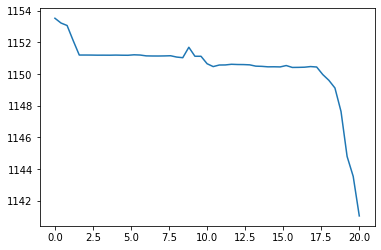

In [8]:
# Question 5

energie = []
for i, t in enumerate(t_eval):
    r_x, r_y, v_x, v_y = split(res.y[:,i])
    energie.append(energie_totale(r_x, r_y, v_x, v_y))
energie = np.array(energie)
plt.plot(t_eval, energie)

In [ ]:
* code pour afficher une animation. res est le tableau provenant de solve_ivp

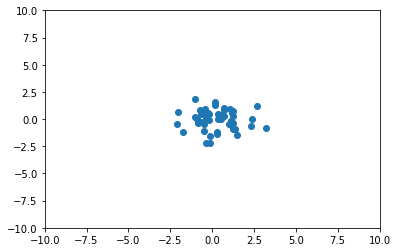

In [9]:
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

fig, ax = plt.subplots()
l, = ax.plot(split(res.y[:,0])[0], split(res.y[:,0])[1], 'o')
ax.set_xlim(-10, 10)
ax.set_ylim(-10, 10)

def animate(i):
    r_x, r_y, v_x, v_y = split(res.y[:,i])
    l.set_data(r_x, r_y)

ani = FuncAnimation(fig, animate, frames=len(res.t))


HTML(ani.to_jshtml())

In [22]:
#Question 7

alpha = 0.2
def force_friction(r_x, r_y, v_x, v_y):
    return -alpha*v_x, 0*v_y

def force_totale(r_x, r_y, v_x, v_y):
    piege = force_piege(r_x, r_y)
    coulomb = force_coulomb(r_x, r_y)
    friction = force_friction(r_x, r_y, v_x, v_y)
    return piege[0]+coulomb[0]+friction[0], piege[1]+coulomb[1]+friction[0]



def f(t, y):
    r_x, r_y, v_x, v_y = split(y)
    f_x, f_y = force_totale(r_x, r_y, v_x, v_y)
    return join(v_x, v_y, f_x/m, f_y/m)

In [ ]:
N = 20

r_x_0 = np.random.normal(size=N)
r_y_0 = np.random.normal(size=N)
v_x_0 = np.random.normal(scale=1/np.sqrt(m), size=N)
v_y_0 = np.random.normal(scale=1/np.sqrt(m), size=N)

t_max = 1500
t_eval=np.linspace(0, t_max, 400)

In [24]:
%%time 
res = solve_ivp(f, [0, t_max], join(r_x_0, r_y_0, v_x_0, v_y_0), 
               t_eval=t_eval)

CPU times: user 10 s, sys: 59 µs, total: 10 s
Wall time: 10 s


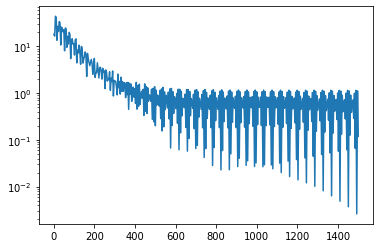

In [12]:
energie = []
for i, t in enumerate(t_eval):
    r_x, r_y, v_x, v_y = split(res.y[:,i])
    energie.append(energie_cinetique(r_x, r_y, v_x, v_y))
energie = np.array(energie)
plt.semilogy(t_eval, energie)

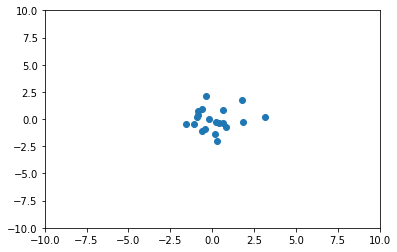

In [13]:
fig, ax = plt.subplots()
l, = ax.plot(split(res.y[:,0])[0], split(res.y[:,0])[1], 'o')
ax.set_xlim(-10, 10)
ax.set_ylim(-10, 10)

def animate(i):
    r_x, r_y, v_x, v_y = split(res.y[:,i])
    l.set_data(r_x, r_y)

ani = FuncAnimation(fig, 
                 animate, 
                 frames=len(res.t),
                interval=100)


HTML(ani.to_jshtml());

In [39]:
# Question 8

from numba import jit

alpha = 0.2

@jit
def join_numba(r_x, r_y, v_x, v_y):
    return np.concatenate((r_x, r_y, v_x, v_y))

@jit
def split_numba(y):
    N = len(y)//4
    return y[:N], y[N:2*N], y[2*N:3*N], y[3*N:4*N]

@jit
def force_piege_numba(r_x, r_y):
    return -k_x*r_x, -k_y*r_y

@jit
def force_coulomb_numba(r_x, r_y):
    N = len(r_x)
    f_x = np.zeros(N)
    f_y = np.zeros(N)
    for i in range(N):
        tot_x, tot_y = 0, 0
        for j in range(N):
            if i!=j:
                d2 = (r_x[i]-r_x[j])**2 + (r_y[i]-r_y[j])**2
                coef = kappa*q**2/(np.sqrt(d2)**3)
                tot_x += coef*(r_x[i]-r_x[j])
                tot_y += coef*(r_y[i]-r_y[j])
        f_x[i] = tot_x
        f_y[i] = tot_y
    return f_x, f_y


@jit
def force_friction_numba(r_x, r_y, v_x, v_y):
    return -alpha*v_x, 0*v_y

@jit
def force_totale_numba(r_x, r_y, v_x, v_y):
    piege = force_piege_numba(r_x, r_y)
    coulomb = force_coulomb_numba(r_x, r_y)
    friction = force_friction_numba(r_x, r_y, v_x, v_y)
    return piege[0]+coulomb[0]+friction[0], piege[1]+coulomb[1]+friction[0]


@jit
def f_numba(t, y):
    r_x, r_y, v_x, v_y = split_numba(y)
    f_x, f_y = force_totale_numba(r_x, r_y, v_x, v_y)
    return join_numba(v_x, v_y, f_x/m, f_y/m)

In [40]:
N = 20

r_x_0 = np.random.normal(size=N)
r_y_0 = np.random.normal(size=N)
v_x_0 = np.random.normal(scale=1/np.sqrt(m), size=N)
v_y_0 = np.random.normal(scale=1/np.sqrt(m), size=N)

t_max = 1500
t_eval=np.linspace(0, t_max, 400)

# Ici, on apelle f_numba un première fois pour la compilation
f_numba(0.0, join(r_x_0, r_y_0, v_x_0, v_y_0));

In [41]:
%%time
res = solve_ivp(f_numba, [0, t_max], join(r_x_0, r_y_0, v_x_0, v_y_0), 
               t_eval=t_eval)

CPU times: user 168 ms, sys: 0 ns, total: 168 ms
Wall time: 167 ms


In [44]:
# Question 9
particle_type = np.array([0]*20 + [1]*5)
masses = np.array([9, 3]) # The masse of particles given by masses[particle_type]
colors = np.array(['blue', 'red'])

@jit
def force_friction_numba(r_x, r_y, v_x, v_y, particle_type):
    return -alpha*v_x*(particle_type==0), 0*v_y

@jit
def force_totale_numba(r_x, r_y, v_x, v_y, particle_type):
    piege = force_piege_numba(r_x, r_y)
    coulomb = force_coulomb_numba(r_x, r_y)
    friction = force_friction_numba(r_x, r_y, v_x, v_y, particle_type)
    return piege[0]+coulomb[0]+friction[0], piege[1]+coulomb[1]+friction[0]

@jit
def f_numba(t, y, particle_type):
    r_x, r_y, v_x, v_y = split_numba(y)
    f_x, f_y = force_totale_numba(r_x, r_y, v_x, v_y, particle_type)
    return join_numba(v_x, v_y, f_x/masses[particle_type], f_y/masses[particle_type])

In [45]:
N = len(masses[particle_type])
r_x_0 = np.random.normal(size=N)
r_y_0 = np.random.normal(size=N)
v_x_0 = np.random.normal(scale=1/np.sqrt(masses[particle_type]), size=N)
v_y_0 = np.random.normal(scale=1/np.sqrt(masses[particle_type]), size=N)

t_max = 1500
t_eval=np.linspace(0, t_max, 400)
res = solve_ivp(f_numba, [0, t_max], join(r_x_0, r_y_0, v_x_0, v_y_0), 
               t_eval=t_eval, args=(particle_type,))


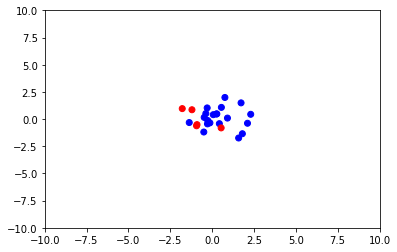

In [46]:
fig, ax = plt.subplots()
X = split(res.y[:,0])[0]
Y = split(res.y[:,0])[1]
l = ax.scatter(X, Y, c=colors[particle_type])
ax.set_xlim(-10, 10)
ax.set_ylim(-10, 10)

def animate(i):
    r_x, r_y, v_x, v_y = split(res.y[:,i])
    off = np.array([r_x, r_y]).T
    l.set_offsets(off)

ani = FuncAnimation(fig, 
                 animate, 
                 frames=len(res.t),
                interval=100)


HTML(ani.to_jshtml())